## Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import os 

from plot import plot_cost_target_localization, plot_target_localization_gradient_norm, plot_scenario, animate_scenario
from utils import gradient_tracking, generate_adj_matrix, get_average_estimate_error, get_average_consensus_error
from configuration import setup_target_localization_problem

## Parameters

In [2]:
SEED = 42
NUM_ITERATIONS = 5000
ALPHA = lambda k: 2e-2

NUM_AGENTS = 5
VARS_DIM = 2
NUM_TARGETS = 1
NOISE_LEVEL = 0.04
GRAPH_TYPE = "erdos_renyi" # one of["erdos_renyi", "cycle", "star", "path"]

In [3]:
#Initialization of the problem
local_loss, z0, robots_pos, targets_pos_real, est_targets_dists = setup_target_localization_problem(
        num_agents=NUM_AGENTS, num_targets=NUM_TARGETS, vars_dim=VARS_DIM, noise_level=NOISE_LEVEL, seed=SEED)

#Inizialization of the network
G, A = generate_adj_matrix(
    NUM_AGENTS,
    connected=True,
    seed=SEED,
    graph_algorithm=GRAPH_TYPE,
    erdos_renyi_p=0.3 if GRAPH_TYPE == "erdos_renyi" else None
)

#Performing the algorithm 
history_z = gradient_tracking(
    loss_functions=local_loss,
    z0=z0.copy(),
    A=A,
    num_iters=NUM_ITERATIONS,
    alpha=ALPHA,
    epsilon=1e-20)

  0%|          | 0/5000 [00:00<?, ?it/s]

Converged at iteration 2725


In [4]:
print(f"Configuration of {NUM_AGENTS} agents, {NUM_TARGETS} of targets and {NOISE_LEVEL} as noise level.")
print("------------------------------------------")
print(
    f"Average estimated distance error: {get_average_estimate_error(history_z[-1], targets_pos_real):.10f}"
    )

Configuration of 5 agents, 1 of targets and 0.04 as noise level.
------------------------------------------
Average estimated distance error: 0.5563130413


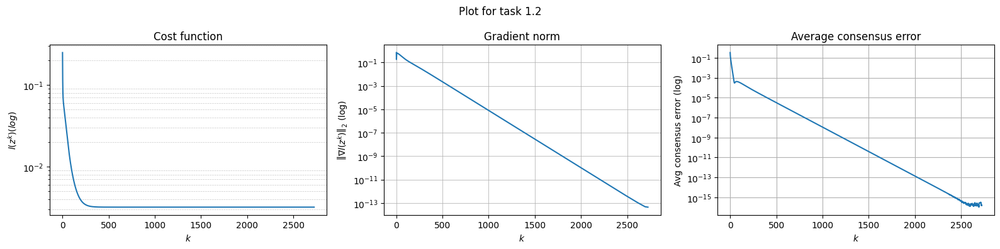

In [5]:
plt.figure(figsize=(16, 4))
plt.suptitle("Plot for task 1.2")

#Plot the cost function
plt.subplot(1,3,1)
plot_cost_target_localization(local_loss, history_z, NUM_AGENTS, GRAPH_TYPE)
plt.xlabel("$k$")
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.grid()
plt.ylabel("$l(z^k) (log)$")
plt.yscale("log")
plt.title("Cost function")
    
#Plot the gradient norm
plt.subplot(1,3,2)
plot_target_localization_gradient_norm(local_loss, history_z, NUM_AGENTS, GRAPH_TYPE)
plt.xlabel("$k$")
plt.grid(visible=True, which='major', linestyle='-', linewidth=0.8, alpha=0.7)
plt.grid(visible=True, which='minor', linestyle=':', linewidth=0.5, alpha=0.4)
# plt.grid()
# plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.ylabel("$\\left\\Vert \\nabla l(z^k) \\right\\Vert_2$ (log)")
plt.yscale('log')
plt.title("Gradient norm")

#Plot the average consensus
plt.subplot(1,3,3)
plt.plot([get_average_consensus_error(z) for z in history_z], label=GRAPH_TYPE)
plt.xlabel("$k$")
plt.ylabel("Avg consensus error (log)")
plt.yscale("log")
plt.grid()
plt.title("Average consensus error")

plt.tight_layout()
plt.show()

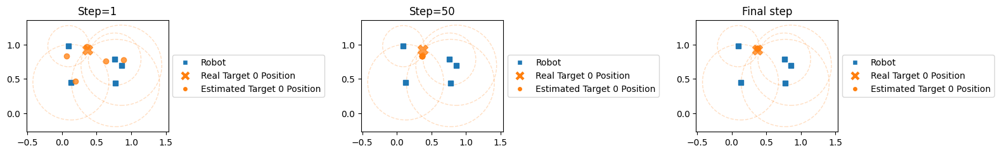

In [6]:
plt.figure(figsize=(16, 4))
plt.subplot(1, 3, 1)
plot_scenario(
    robots_pos=robots_pos,
    targets_pos_real=targets_pos_real,
    est_targets_dists=est_targets_dists,
    est_targets_pos=history_z[0],
    num_targets=NUM_TARGETS,
)
plt.title("Step=1")
plt.subplot(1, 3, 2)
plt.title("Step=50")
plot_scenario(
    robots_pos=robots_pos,
    targets_pos_real=targets_pos_real,
    est_targets_dists=est_targets_dists,
    est_targets_pos=history_z[50],
    num_targets=NUM_TARGETS,
)
plt.subplot(1, 3, 3)
plt.title("Final step")
plot_scenario(
    robots_pos=robots_pos,
    targets_pos_real=targets_pos_real,
    est_targets_dists=est_targets_dists,
    est_targets_pos=history_z[-1],
    num_targets=NUM_TARGETS,
)
plt.tight_layout()
plt.show()

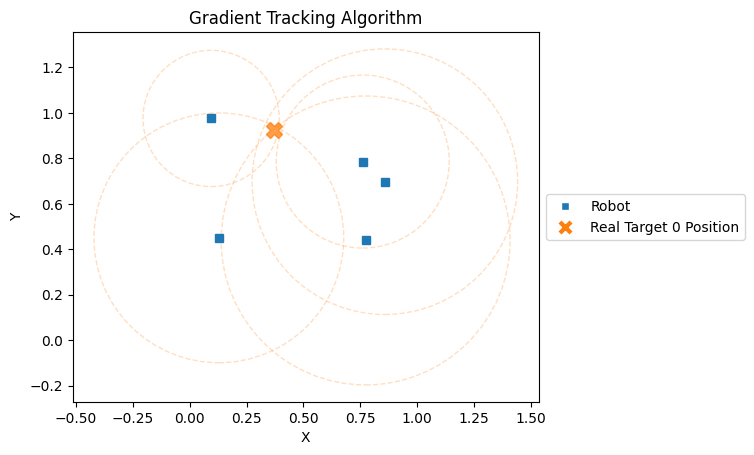

In [7]:
#Da sistemare 
animate_scenario(history_z, frames=range(0, len(history_z), 10), robots_pos=robots_pos, targets_pos_real=targets_pos_real, est_targets_dists=est_targets_dists, NUM_TARGETS=NUM_TARGETS)